In [9]:
'''
required_packages = [
    "networkx",
    "python-louvain",
    "rdflib",
    "node2vec",
    "matplotlib",
    "numpy"
]

# Устанавливаем пакеты
for package in required_packages:
    install_package_via_requests(package)
''';

In [8]:
# Аналитические и машинное обучение
import json
import random
import numpy as np
import pandas as pd
from scipy.spatial.distance import cosine
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
import umap

# Визуализация
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Работа с графами и RDF данными
import networkx as nx
from networkx.algorithms import community
from community import community_louvain
from rdflib import Graph, URIRef, Literal, Namespace
from rdflib.namespace import RDF, RDFS
from node2vec import Node2Vec

In [14]:
# Вспомогательная функция для добавления персонажа и его связей
def add_character(character):
    character_uri = URIRef(namespace + str(character['Id']))  # Создание URI для персонажа
    g.add((character_uri, RDF.type, URIRef(namespace + 'Character')))  # Добавление типа узла как "Character"
    if character['Name']:
        g.add((character_uri, RDFS.label, Literal(character['Name'])))  # Добавление имени персонажа
    
    # Добавление псевдонимов и титулов
    for alias in character['Aliases']:
        g.add((character_uri, URIRef(namespace + 'hasAlias'), Literal(alias)))
    for title in character['Titles']:
        g.add((character_uri, URIRef(namespace + 'hasTitle'), Literal(title)))
    
    # Добавление принадлежности к домам (связи между персонажами и домами)
    for allegiance in character['Allegiances']:
        house_uri = URIRef(namespace + str(allegiance))
        g.add((character_uri, URIRef(namespace + 'belongsToHouse'), house_uri))

# Вспомогательная функция для добавления дома в RDF
def add_house(house):
    house_uri = URIRef(namespace + str(house['Id']))  # Создание URI для дома
    g.add((house_uri, RDF.type, URIRef(namespace + 'House')))  # Добавление типа узла как "House"
    if house['Name']:
        g.add((house_uri, RDFS.label, Literal(house['Name'])))  # Добавление имени дома
    if house['Region']:
        g.add((house_uri, URIRef(namespace + 'hasRegion'), Literal(house['Region'])))  # Добавление региона дома

# Проверка, пустой ли граф
def safe_average_clustering(graph):
    if len(graph) == 0 or graph.number_of_edges() == 0:  # Если граф пустой или не содержит рёбер
        print("Граф пуст или не содержит рёбер. Пропускаем вычисление коэффициента кластеризации.")
        return 0
    return nx.average_clustering(graph)  # Возвращаем средний коэффициент кластеризации

# Функция для вычисления косинусного сходства между двумя векторами
def cosine_similarity(vec1, vec2):
    return 1 - cosine(vec1, vec2)  # Косинусное сходство: 1 - косинусное расстояние

# Part 1: RDF creation and statisitical analysis

In [12]:
with open("Data/characters.json") as f:
    characters_data = json.load(f)

with open("Data/houses.json") as f:
    houses_data = json.load(f)

In [15]:
# Создаём RDF-граф
g = Graph()

# Определяем пространства имен
namespace = URIRef("http://example.org/gameofthrones#")

# Заполняем RDF-граф персонажами и домами
for character in characters_data:
    add_character(character)

for house in houses_data:
    add_house(house)

# Пример SPARQL-запроса - Найти всех персонажей, принадлежащих к определённому дому
sparql_query = """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?house
WHERE {
    ?character :belongsToHouse :HouseStark .
    ?character :hasAlias ?alias .
    ?house :hasRegion "The North" .
}
"""
# Выполняем запрос и выводим результаты
results = g.query(sparql_query)
for row in results:
    print(f"Персонаж: {row.character}, Дом: {row.house}")

# Создание графа NetworkX из RDF-данных
graph = nx.Graph()

# Добавляем узлы для персонажей и домов
for character in characters_data:
    character_node = f"Character_{character['Id']}"
    graph.add_node(character_node, label=character.get('Name', 'Неизвестный персонаж'))
    for allegiance in character['Allegiances']:
        house_node = f"House_{allegiance}"
        graph.add_node(house_node, label=f"Дом {allegiance}")
        graph.add_edge(character_node, house_node)

# Удаляем создание эмбеддингов, так как они здесь не нужны
# Если потребуется добавить эмбеддинги, их можно вернуть позже

# Пример проверки узлов
print(f"Граф содержит {graph.number_of_nodes()} узлов и {graph.number_of_edges()} рёбер.")


Граф содержит 2431 узлов и 1567 рёбер.


Top 5 Nodes by Degree Centrality:
[('House Frey of the Crossing', 0.05063812268423219), ("House Targaryen of King's Landing", 0.04158089748867847), ('House Stark of Winterfell', 0.036228900782214905), ('House Lannister of Casterly Rock', 0.03252367229312474), ('House Tyrell of Highgarden', 0.018114450391107453)]

Top 5 Nodes by Betweenness Centrality:
[("House Targaryen of King's Landing", 0.09057752120892011), ('House Frey of the Crossing', 0.0797257331842652), ('House Lannister of Casterly Rock', 0.06593302041370493), ('House Stark of Winterfell', 0.05306639433210258), ('Character_1826', 0.037973800704987966)]

Top 5 Nodes by Closeness Centrality:
[('House Lannister of Casterly Rock', 0.09592879728855544), ("House Targaryen of King's Landing", 0.09422524721831668), ('Character_1826', 0.09127170353639698), ('House Frey of the Crossing', 0.09003272113545041), ('Character_195', 0.08935882352216111)]

Number of communities detected: 955


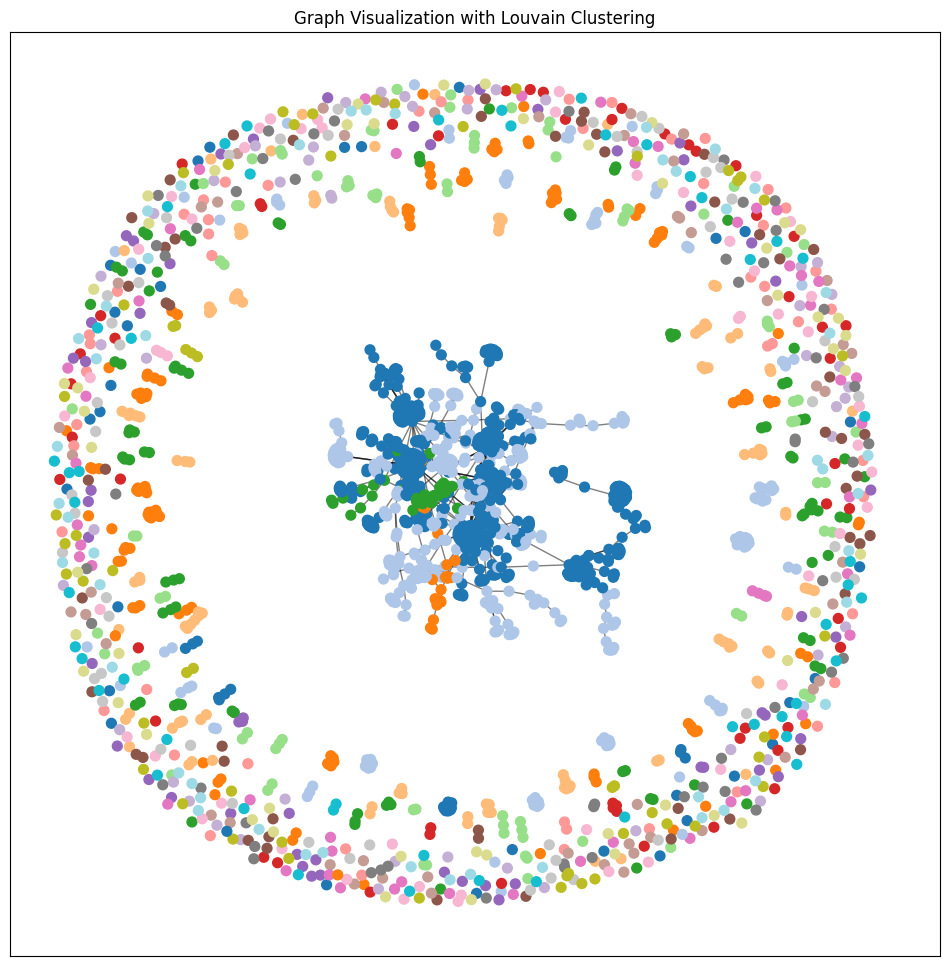


Number of connected components: 930


In [16]:
# Создаем словарь для соответствия ID домов и их названий
house_names = {house['Id']: house['Name'] for house in houses_data}

# Строим граф
graph = nx.Graph()

# Добавляем узлы и ребра
for character in characters_data:
    char_id = f"Character_{character['Id']}"
    graph.add_node(char_id, label=character.get('Name', 'Unknown'))
    for allegiance in character['Allegiances']:
        house_name = house_names.get(allegiance, f"House {allegiance}")  # Находим название дома или оставляем идентификатор
        graph.add_node(house_name, label=house_name)  # Узел с названием дома
        graph.add_edge(char_id, house_name)

# Анализ центральности
degree_centrality = nx.degree_centrality(graph)
betweenness_centrality = nx.betweenness_centrality(graph)
closeness_centrality = nx.closeness_centrality(graph)

# Вывод топ-5 узлов по центральности
print("Top 5 Nodes by Degree Centrality:")
print(sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5])

print("\nTop 5 Nodes by Betweenness Centrality:")
print(sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:5])

print("\nTop 5 Nodes by Closeness Centrality:")
print(sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:5])

# Кластеризация Louvain
from community import community_louvain

partition = community_louvain.best_partition(graph)  # Выполняем кластеризацию
num_communities = len(set(partition.values()))
print(f"\nNumber of communities detected: {num_communities}")

# Визуализация графа с кластерами
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(graph)
colors = [partition[node] for node in graph.nodes()]
nx.draw_networkx_nodes(graph, pos, node_size=50, node_color=colors, cmap=plt.cm.tab20)
nx.draw_networkx_edges(graph, pos, alpha=0.5)
plt.title("Graph Visualization with Louvain Clustering")
plt.show()

# Анализ компонентов связности
connected_components = list(nx.connected_components(graph))
print(f"\nNumber of connected components: {len(connected_components)}")


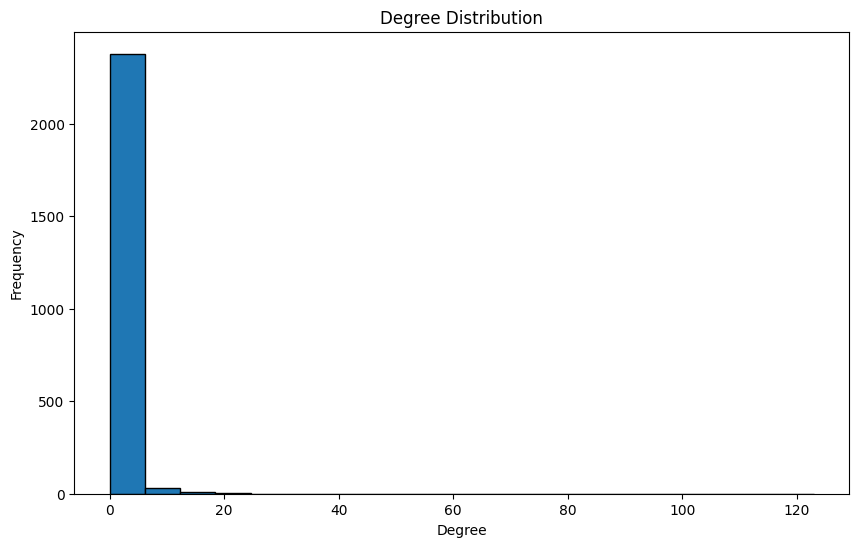

Граф не связный, пропускаем вычисление средней длины пути.
Средний коэффициент кластеризации: 0.0
Плотность графа: 0.0005309641556839763

Сравнение коэффициентов кластеризации:
Оригинальный граф: 0.0
Случайный граф: 0.0


KeyboardInterrupt: 

In [17]:
# 1. Анализ распределения степеней узлов
def plot_degree_distribution(graph):
    degrees = [degree for node, degree in graph.degree()]
    plt.figure(figsize=(10, 6))
    plt.hist(degrees, bins=20, edgecolor="black")
    plt.title("Degree Distribution")
    plt.xlabel("Degree")
    plt.ylabel("Frequency")
    plt.show()

plot_degree_distribution(graph)

# 2. Средняя длина пути (если граф связный)
if nx.is_connected(graph):
    avg_path_length = nx.average_shortest_path_length(graph)
    print(f"Средняя длина пути: {avg_path_length}")
else:
    print("Граф не связный, пропускаем вычисление средней длины пути.")

# 3. Коэффициент кластеризации
clustering_coefficient = nx.average_clustering(graph)
print(f"Средний коэффициент кластеризации: {clustering_coefficient}")

# 4. Плотность графа
density = nx.density(graph)
print(f"Плотность графа: {density}")

# 5. Сравнение с другими типами графов
def compare_graphs(graph):
    n = graph.number_of_nodes()
    m = graph.number_of_edges()
    
    # Генерация случайного графа
    random_graph = nx.gnm_random_graph(n, m)
    
    # Генерация графа Барбаши-Альберт
    try:
        scale_free_graph = nx.barabasi_albert_graph(n, max(1, min(m, n // 2)))
    except Exception as e:
        print(f"Ошибка генерации графа Барбаши-Альберт: {e}")
        scale_free_graph = nx.Graph()
    
    # Генерация графа Ваттса-Строгатца
    try:
        small_world_graph = nx.watts_strogatz_graph(n, k=max(2, int(np.mean([deg for _, deg in graph.degree()]))), p=0.1)
    except Exception as e:
        print(f"Ошибка генерации графа Ваттса-Строгатца: {e}")
        small_world_graph = nx.Graph()

    # Сравнение коэффициентов кластеризации
    print("\nСравнение коэффициентов кластеризации:")
    print(f"Оригинальный граф: {nx.average_clustering(graph)}")
    print(f"Случайный граф: {nx.average_clustering(random_graph)}")
    print(f"Граф Барбаши-Альберт: {nx.average_clustering(scale_free_graph)}")
    print(f"Граф Ваттса-Строгатца: {nx.average_clustering(small_world_graph)}")
    
    # Визуализация распределения степеней
    plt.figure(figsize=(10, 6))
    for g, label in zip([graph, random_graph, scale_free_graph, small_world_graph], 
                        ["Оригинальный", "Случайный", "Барбаши-Альберт", "Ваттс-Строгатц"]):
        degrees = [degree for node, degree in g.degree()]
        plt.hist(degrees, bins=20, alpha=0.5, label=label)
    plt.title("Сравнение распределения степеней узлов")
    plt.xlabel("Степень узла")
    plt.ylabel("Частота")
    plt.legend()
    plt.show()

compare_graphs(graph)


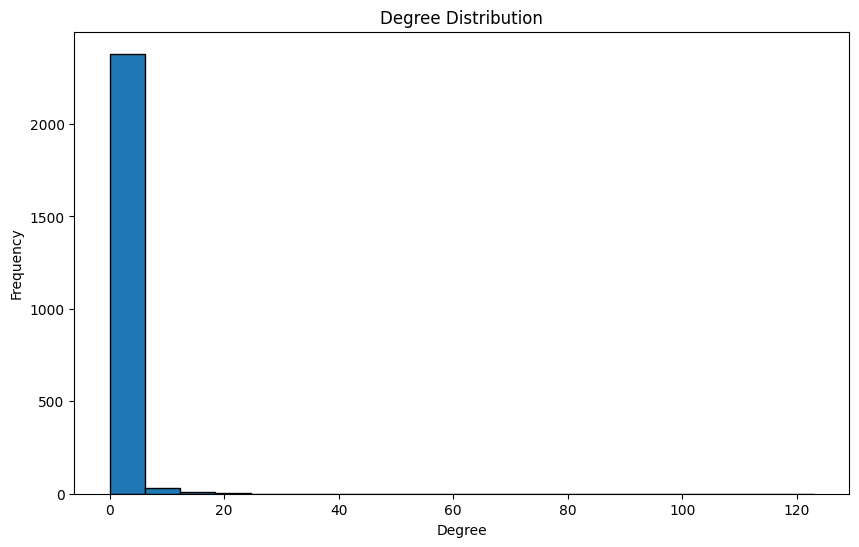

Graph is not connected, skipping average path length calculation.
Average Clustering Coefficient: 0.0
Graph Density: 0.0005305273279129488

Comparison of Clustering Coefficients:
Original Graph: 0.0
Random Graph: 0.0
Scale-Free Graph: 0.7239134540350917
Small-World Graph: 0.0

Comparison of Clustering Coefficients:
Original Graph: 0.0
Random Graph: 0.0
Scale-Free Graph: 0.7239134540350917
Small-World Graph: 0.0


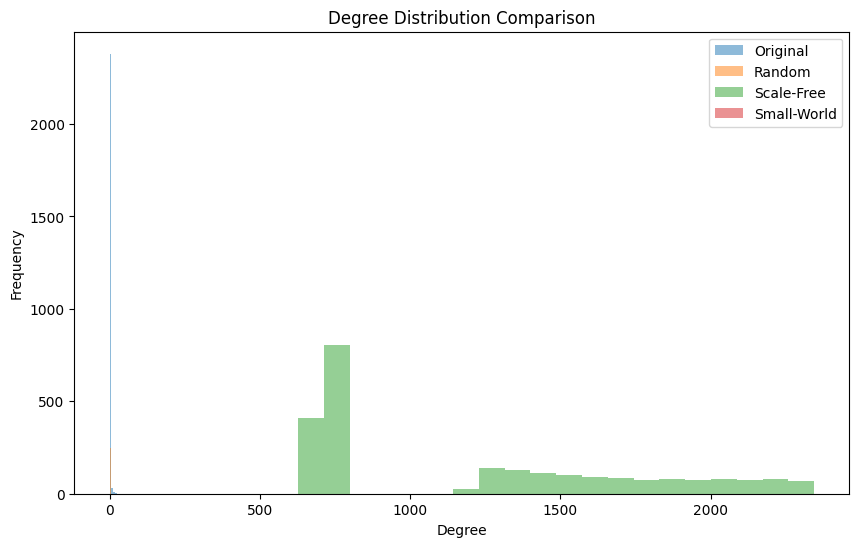

In [12]:
# 1. Анализ распределения степеней узлов
degrees = [degree for node, degree in graph.degree()]
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=20, edgecolor="black")
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()

# 2. Средняя длина пути (если граф связный)
if nx.is_connected(graph):
    avg_path_length = nx.average_shortest_path_length(graph)
    print(f"Average Path Length: {avg_path_length}")
else:
    print("Graph is not connected, skipping average path length calculation.")

# 3. Коэффициент кластеризации
clustering_coefficient = nx.average_clustering(graph)
print(f"Average Clustering Coefficient: {clustering_coefficient}")

# 4. Плотность графа
density = nx.density(graph)
print(f"Graph Density: {density}")

# 5. Сравнение с другими типами графов
# Генерация случайного графа
n = graph.number_of_nodes()
m = graph.number_of_edges()
random_graph = nx.gnm_random_graph(n, m)

# Генерация графов
try:
    # Генерация графа Барбаши-Альберт
    m = max(1, min(m, n // 2))  # Обеспечиваем m >= 1 и m < n
    scale_free_graph = nx.barabasi_albert_graph(n, m)
except Exception as e:
    print(f"Error in generating Barabási–Albert graph: {e}")
    scale_free_graph = nx.Graph()

try:
    # Генерация графа Ваттса-Строгатца
    small_world_graph = nx.watts_strogatz_graph(n, k=max(2, int(np.mean(degrees))), p=0.1)
except Exception as e:
    print(f"Error in generating Watts-Strogatz graph: {e}")
    small_world_graph = nx.Graph()

# Сравнение коэффициентов кластеризации
print("\nComparison of Clustering Coefficients:")
print(f"Original Graph: {safe_average_clustering(graph)}")
print(f"Random Graph: {safe_average_clustering(random_graph)}")
print(f"Scale-Free Graph: {safe_average_clustering(scale_free_graph)}")
print(f"Small-World Graph: {safe_average_clustering(small_world_graph)}")


# Сравнение коэффициентов кластеризации
print("\nComparison of Clustering Coefficients:")
print(f"Original Graph: {clustering_coefficient}")
print(f"Random Graph: {nx.average_clustering(random_graph)}")
print(f"Scale-Free Graph: {nx.average_clustering(scale_free_graph)}")
print(f"Small-World Graph: {nx.average_clustering(small_world_graph)}")

# Визуализация распределения степеней для всех графов
plt.figure(figsize=(10, 6))
for g, label in zip([graph, random_graph, scale_free_graph, small_world_graph], 
                    ["Original", "Random", "Scale-Free", "Small-World"]):
    degrees = [degree for node, degree in g.degree()]
    plt.hist(degrees, bins=20, alpha=0.5, label=label)

plt.title("Degree Distribution Comparison")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.legend()
plt.show()



Анализ графа: Оригинальный граф
Число узлов: 5958
Число рёбер: 9532
Плотность: 0.0005371380650508458
Средняя длина пути: 3.2797852552220084
Средний коэффициент кластеризации: 0.04420390928954334


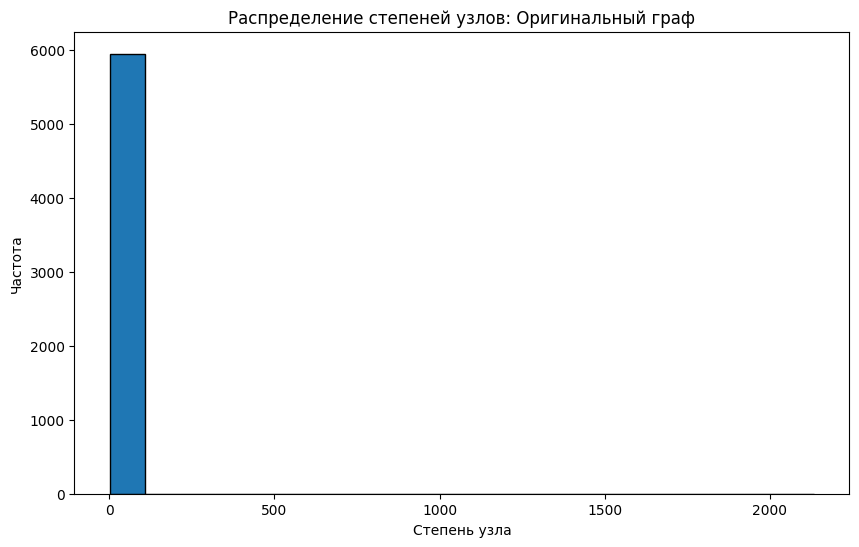


Анализ графа: Граф Ваттса-Строгатца (Small-World)
Число узлов: 5958
Число рёбер: 5958
Плотность: 0.00033573946617424877
Граф не связный, средняя длина пути не вычисляется.
Средний коэффициент кластеризации: 0.0


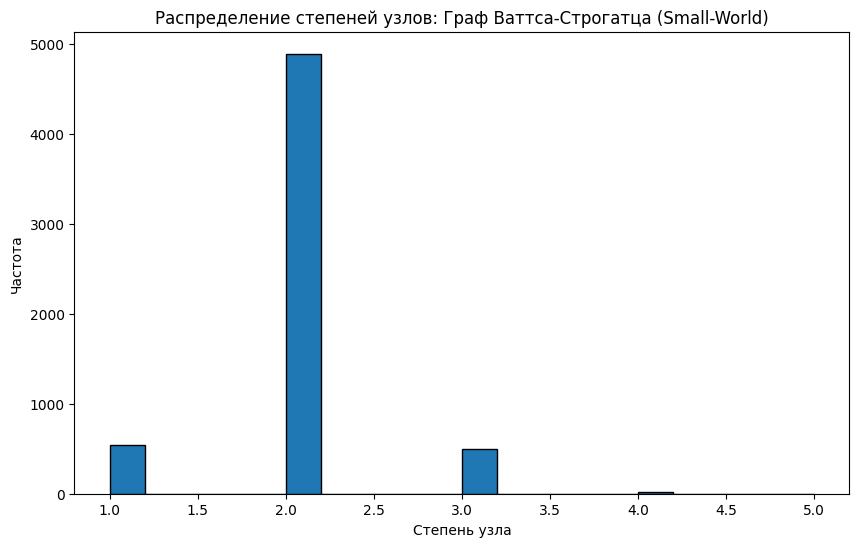


Анализ графа: Граф Барбаши-Альберт (Scale-Free)
Число узлов: 5958
Число рёбер: 8874441
Плотность: 0.5000839348665436
Средняя длина пути: 1.4999160651334564


KeyboardInterrupt: 

In [22]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random

# Преобразование g в граф NetworkX, если это возможно
try:
    if isinstance(g, nx.Graph):
        original_graph = g.copy()
    elif hasattr(g, 'triples'):  # Если g — RDF-граф
        original_graph = nx.Graph()
        for subj, pred, obj in g.triples((None, None, None)):
            original_graph.add_edge(subj, obj, predicate=pred)
    else:
        raise ValueError("g не является корректным графом или RDF-объектом")
except Exception as e:
    print(f"Ошибка преобразования g: {e}")
    original_graph = nx.Graph()

# Проверка: граф должен быть непустым
if original_graph.number_of_nodes() == 0 or original_graph.number_of_edges() == 0:
    print("Граф пустой. Пожалуйста, предоставьте корректные данные для анализа.")
else:
    # Генерация графов для анализа
    k = max(2, int(np.mean([deg for _, deg in original_graph.degree()])))
    p = 0.1  # Вероятность переподключения рёбер
    small_world_graph = nx.watts_strogatz_graph(original_graph.number_of_nodes(), k, p)

    m = max(1, min(original_graph.number_of_edges(), original_graph.number_of_nodes() // 2))
    scale_free_graph = nx.barabasi_albert_graph(original_graph.number_of_nodes(), m)

    n = original_graph.number_of_nodes()
    random_graph = nx.gnm_random_graph(n, original_graph.number_of_edges())

    # Анализ и сравнение графов
    def analyze_graph(graph, name):
        print(f"\nАнализ графа: {name}")
        print(f"Число узлов: {graph.number_of_nodes()}")
        print(f"Число рёбер: {graph.number_of_edges()}")
        print(f"Плотность: {nx.density(graph)}")
        if nx.is_connected(graph):
            avg_path_length = nx.average_shortest_path_length(graph)
            print(f"Средняя длина пути: {avg_path_length}")
        else:
            print("Граф не связный, средняя длина пути не вычисляется.")
        clustering_coefficient = nx.average_clustering(graph)
        print(f"Средний коэффициент кластеризации: {clustering_coefficient}")

    def plot_degree_distribution(graph, name):
        degrees = [degree for _, degree in graph.degree()]
        plt.figure(figsize=(10, 6))
        plt.hist(degrees, bins=20, edgecolor="black")
        plt.title(f"Распределение степеней узлов: {name}")
        plt.xlabel("Степень узла")
        plt.ylabel("Частота")
        plt.show()

    # Анализ графов
    analyze_graph(original_graph, "Оригинальный граф")
    plot_degree_distribution(original_graph, "Оригинальный граф")
    analyze_graph(small_world_graph, "Граф Ваттса-Строгатца (Small-World)")
    plot_degree_distribution(small_world_graph, "Граф Ваттса-Строгатца (Small-World)")
    analyze_graph(scale_free_graph, "Граф Барбаши-Альберт (Scale-Free)")
    plot_degree_distribution(scale_free_graph, "Граф Барбаши-Альберт (Scale-Free)")
    analyze_graph(random_graph, "Случайный граф (Random Graph)")
    plot_degree_distribution(random_graph, "Случайный граф (Random Graph)")

    # Сравнение графов
    def compare_graphs(original, transformed, name):
        print(f"\nСравнение с {name}:")
        print(f"Плотность оригинального графа: {nx.density(original)}")
        print(f"Плотность {name}: {nx.density(transformed)}")
        print(f"Средний коэффициент кластеризации оригинального графа: {nx.average_clustering(original)}")
        print(f"Средний коэффициент кластеризации {name}: {nx.average_clustering(transformed)}")

    compare_graphs(original_graph, small_world_graph, "Граф Ваттса-Строгатца")
    compare_graphs(original_graph, scale_free_graph, "Граф Барбаши-Альберт")
    compare_graphs(original_graph, random_graph, "Случайный граф")

Оригинальный граф наиболее близок к Графу Ваттса-Строгатца (Small-World) по плотности. Однако коэффициент кластеризации оригинального графа выше, что может указывать на необходимость доработки модели Small-World для более точного соответствия оригиналу.


Количество обнаруженных сообществ: 76
Сообщество 0: [rdflib.term.URIRef('http://example.org/gameofthrones#635'), rdflib.term.Literal('Defender of the Citadel'), rdflib.term.URIRef('http://example.org/gameofthrones#109'), rdflib.term.Literal('Alyssa Targaryen'), rdflib.term.URIRef('http://example.org/gameofthrones#154')]... (Всего: 282 узлов)
Сообщество 1: [rdflib.term.URIRef('http://example.org/gameofthrones#586'), rdflib.term.Literal('The Smalljon'), rdflib.term.URIRef('http://example.org/gameofthrones#903'), rdflib.term.URIRef('http://example.org/gameofthrones#471'), rdflib.term.Literal('The Drunken Giant')]... (Всего: 58 узлов)
Сообщество 2: [rdflib.term.URIRef('http://example.org/gameofthrones#1077'), rdflib.term.Literal('Protector of the Realm'), rdflib.term.URIRef('http://example.org/gameofthrones#912'), rdflib.term.Literal('Master-at-arms of Winterfell'), rdflib.term.URIRef('http://example.org/gameofthrones#695')]... (Всего: 132 узлов)
Сообщество 3: [rdflib.term.URIRef('http://

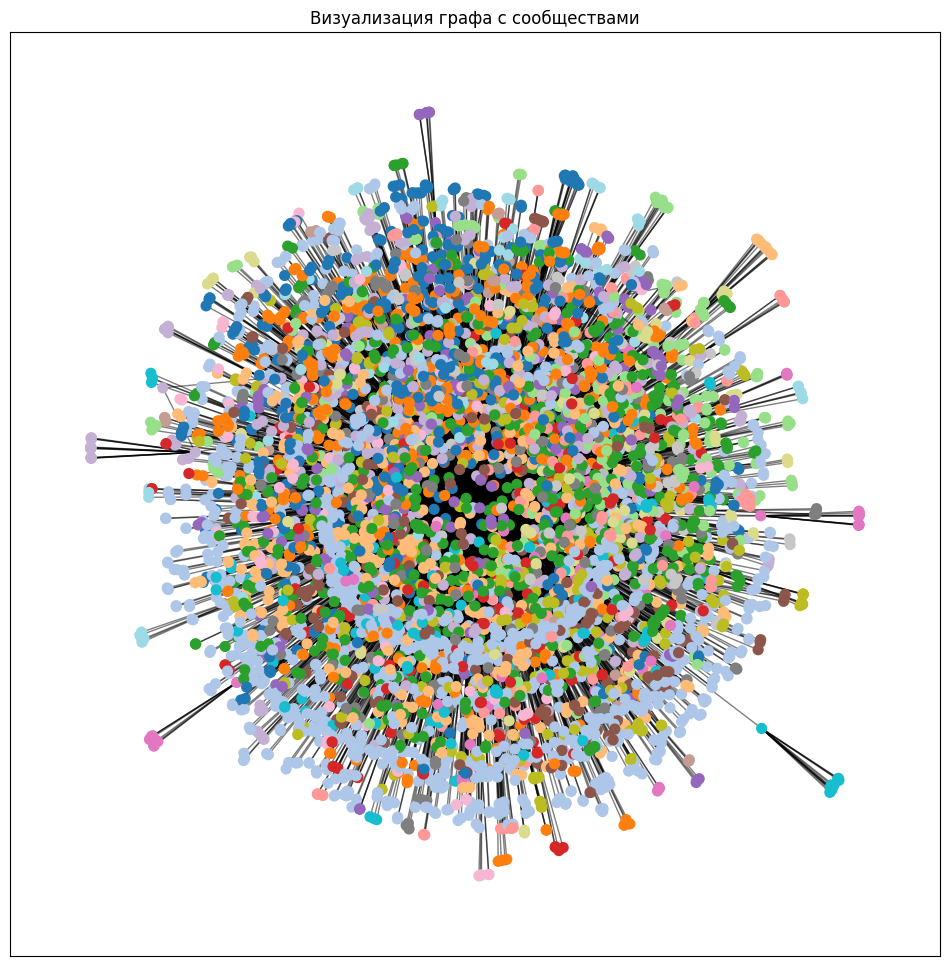


Количество обнаруженных сообществ: 74
Сообщество 0: [rdflib.term.URIRef('http://example.org/gameofthrones#635'), rdflib.term.Literal('Defender of the Citadel'), rdflib.term.URIRef('http://example.org/gameofthrones#154'), rdflib.term.URIRef('http://example.org/gameofthrones#1672'), rdflib.term.Literal('Maris the Maid')]... (Всего: 293 узлов)
Сообщество 1: [rdflib.term.URIRef('http://example.org/gameofthrones#586'), rdflib.term.Literal('The Smalljon'), rdflib.term.URIRef('http://example.org/gameofthrones#903'), rdflib.term.URIRef('http://example.org/gameofthrones#471'), rdflib.term.Literal('The Drunken Giant')]... (Всего: 57 узлов)
Сообщество 2: [rdflib.term.URIRef('http://example.org/gameofthrones#825'), rdflib.term.URIRef('http://example.org/gameofthrones#382'), rdflib.term.Literal('House Teague'), rdflib.term.URIRef('http://example.org/gameofthrones#979'), rdflib.term.Literal('Sigfryd Silverhair')]... (Всего: 80 узлов)
Сообщество 3: [rdflib.term.URIRef('http://example.org/gameofthron

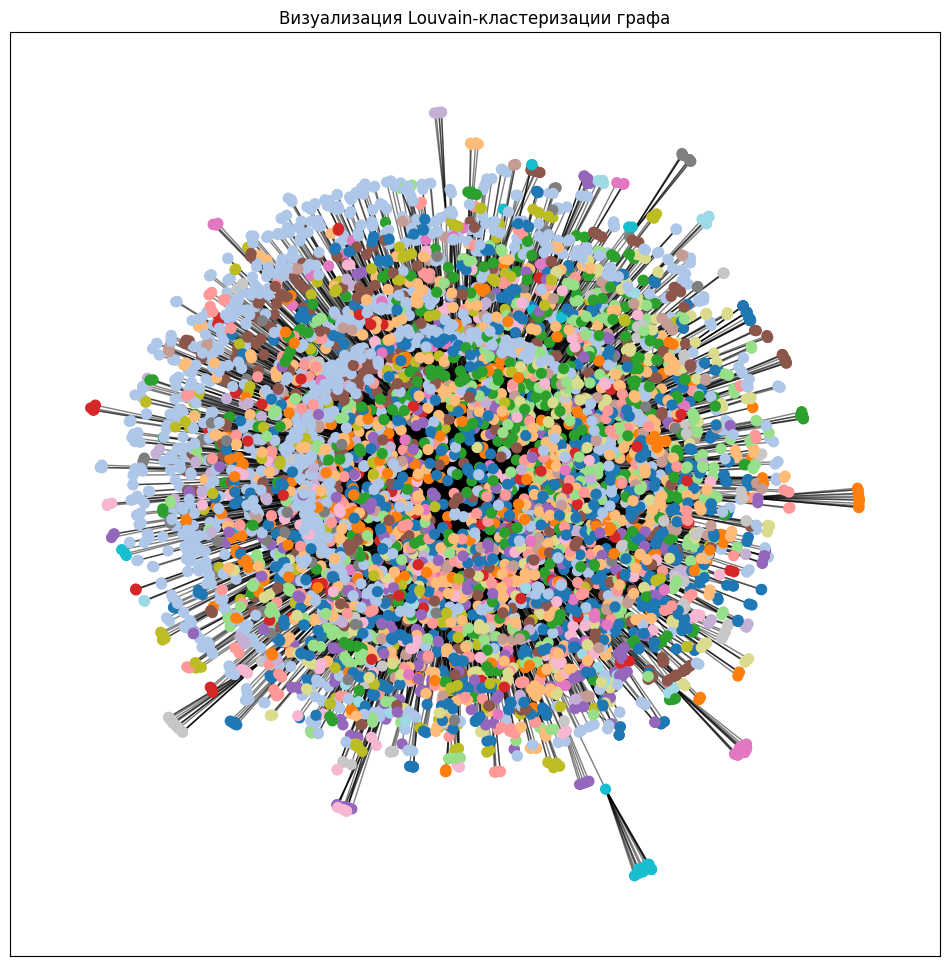

In [23]:

# Кластеризация Louvain
partition = community_louvain.best_partition(original_graph)

# Количество сообществ
num_communities = len(set(partition.values()))
print(f"\nКоличество обнаруженных сообществ: {num_communities}")

# Выводим первые несколько сообществ
for community_id in set(partition.values()):
    community_nodes = [node for node, comm in partition.items() if comm == community_id]
    print(f"Сообщество {community_id}: {community_nodes[:5]}... (Всего: {len(community_nodes)} узлов)")

# Визуализация с сообществами
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(original_graph)
colors = [partition[node] for node in original_graph.nodes()]
nx.draw_networkx_nodes(original_graph, pos, node_size=50, node_color=colors, cmap=plt.cm.tab20)
nx.draw_networkx_edges(original_graph, pos, alpha=0.5)
plt.title("Визуализация графа с сообществами")
plt.show()

# Дополнительный код для Louvain
partition = community_louvain.best_partition(original_graph)

# Количество сообществ
num_communities = len(set(partition.values()))
print(f"\nКоличество обнаруженных сообществ: {num_communities}")

# Выводим сообщества
for community_id in set(partition.values()):
    community_nodes = [node for node, comm in partition.items() if comm == community_id]
    print(f"Сообщество {community_id}: {community_nodes[:5]}... (Всего: {len(community_nodes)} узлов)")

# Визуализация с сообществами
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(original_graph)
colors = [partition[node] for node in original_graph.nodes()]
nx.draw_networkx_nodes(original_graph, pos, node_size=50, node_color=colors, cmap=plt.cm.tab20)
nx.draw_networkx_edges(original_graph, pos, alpha=0.5)
plt.title("Визуализация Louvain-кластеризации графа")
plt.show()

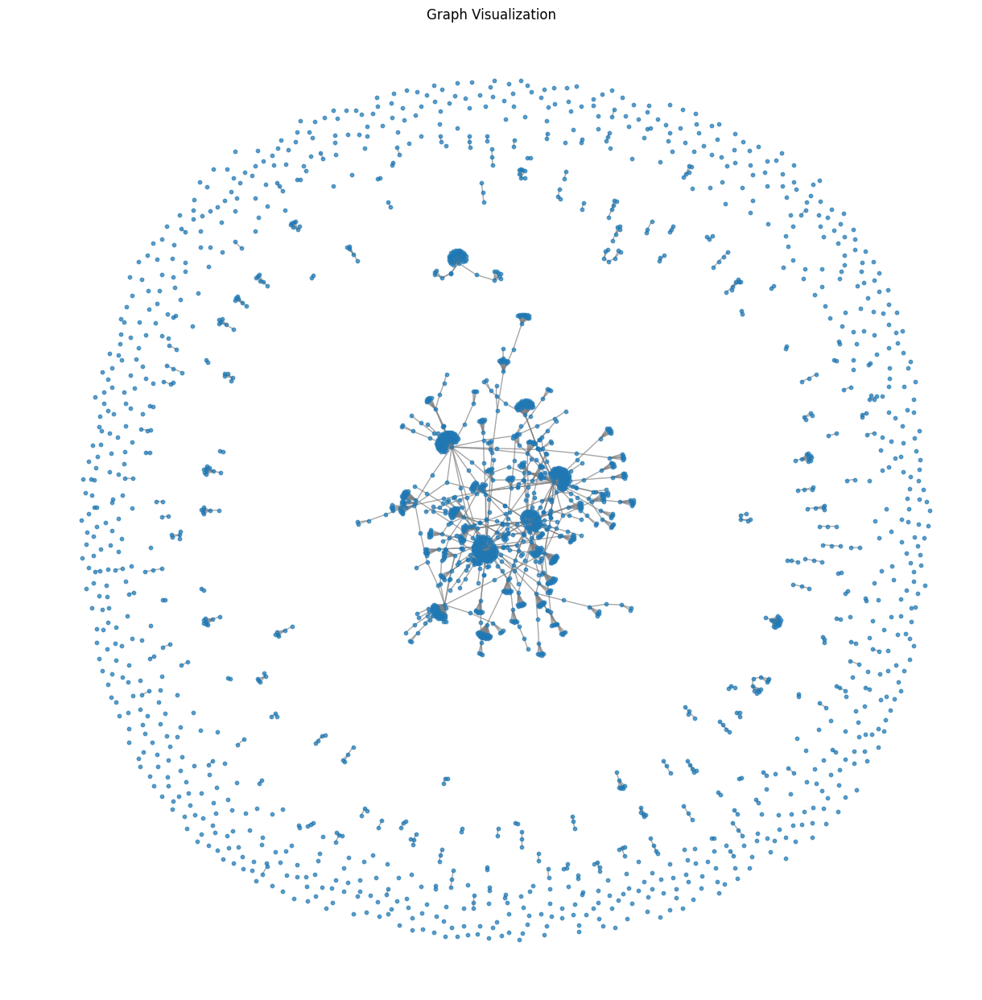

In [25]:
with open('Data/characters.json') as f:
    characters = json.load(f)

with open('Data/houses.json') as f:
    houses = json.load(f)

# Построение графа NetworkX
G = nx.Graph()

# Добавление узлов и рёбер
for character in characters:
    char_id = f"Character_{character['Id']}"
    G.add_node(char_id, label=character.get('Name', 'Unknown Character'))
    for allegiance in character['Allegiances']:
        house_id = f"House_{allegiance}"
        G.add_node(house_id, label=f"House {allegiance}")
        G.add_edge(char_id, house_id)

# Убедитесь, что plt работает корректно
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # Расположение узлов
nx.draw(
    G, 
    pos, 
    node_size=10, 
    alpha=0.7, 
    edge_color="gray", 
    with_labels=False  # Без подписей, чтобы не загромождать
)
plt.title("Graph Visualization")
plt.show()

In [29]:
# Создание RDF-графа
rdf_graph = Graph()

# Пример преобразования данных в RDF
namespace = URIRef("http://example.org/gameofthrones#")

for character in characters:
    char_uri = URIRef(namespace + f"Character_{character['Id']}")
    rdf_graph.add((char_uri, RDF.type, URIRef(namespace + "Character")))
    for allegiance in character['Allegiances']:
        house_uri = URIRef(namespace + f"House_{allegiance}")
        rdf_graph.add((char_uri, URIRef(namespace + "belongsToHouse"), house_uri))

# Пример SPARQL-запроса
query = """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?house
WHERE {
    ?character a :Character ;
              :belongsToHouse ?house .
}
"""
results = rdf_graph.query(query)
for row in results:
    print(f"Character: {row.character}, House: {row.house}")

Character: http://example.org/gameofthrones#Character_2, House: http://example.org/gameofthrones#House_362
Character: http://example.org/gameofthrones#Character_3, House: http://example.org/gameofthrones#House_15
Character: http://example.org/gameofthrones#Character_7, House: http://example.org/gameofthrones#House_15
Character: http://example.org/gameofthrones#Character_8, House: http://example.org/gameofthrones#House_23
Character: http://example.org/gameofthrones#Character_16, House: http://example.org/gameofthrones#House_398
Character: http://example.org/gameofthrones#Character_20, House: http://example.org/gameofthrones#House_362
Character: http://example.org/gameofthrones#Character_27, House: http://example.org/gameofthrones#House_229
Character: http://example.org/gameofthrones#Character_29, House: http://example.org/gameofthrones#House_195
Character: http://example.org/gameofthrones#Character_30, House: http://example.org/gameofthrones#House_143
Character: http://example.org/gameo

# Part 2: Embeddings and embeddings analysis

Онтология сохранена в файл Data/ontology.ttl.


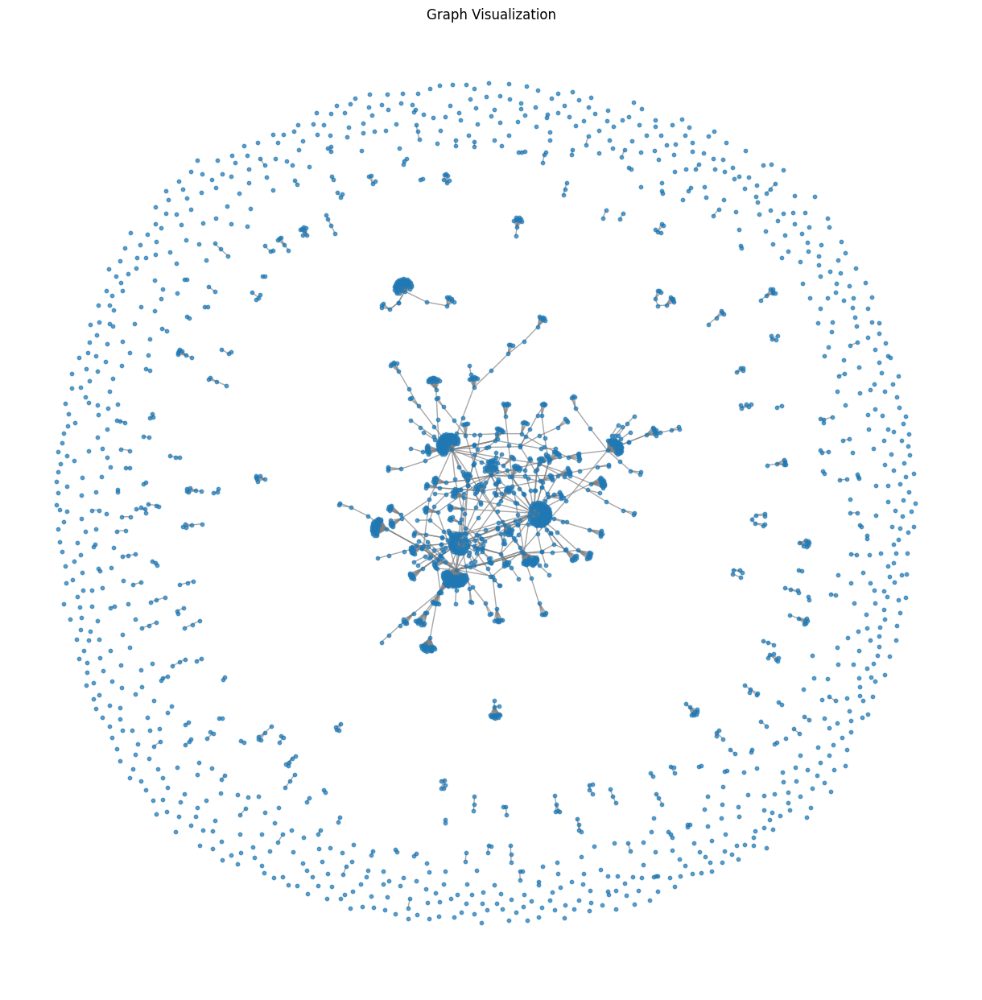

Generating walks (CPU: 1): 100%|█████████████████████████████████████████████████████| 200/200 [00:38<00:00,  5.16it/s]


Эмбеддинги сохранены в файлы 'Data/graph_embeddings.csv' и 'Data/graph_embeddings.npy'.


In [36]:
for character in characters:
    char_uri = URIRef(namespace + f"Character_{character['Id']}")
    rdf_graph.add((char_uri, RDF.type, URIRef(namespace + "Character")))
    if character.get('Name'):
        rdf_graph.add((char_uri, RDFS.label, Literal(character['Name'])))
    for allegiance in character.get('Allegiances', []):
        house_uri = URIRef(namespace + f"House_{allegiance}")
        rdf_graph.add((char_uri, URIRef(namespace + "belongsToHouse"), house_uri))

for house in houses:
    house_uri = URIRef(namespace + f"House_{house['Id']}")
    rdf_graph.add((house_uri, RDF.type, URIRef(namespace + "House")))
    if house.get('Name'):
        rdf_graph.add((house_uri, RDFS.label, Literal(house['Name'])))
    if house.get('Region'):
        rdf_graph.add((house_uri, URIRef(namespace + "hasRegion"), Literal(house['Region'])))

# Сохранение RDF-графа
rdf_graph.serialize(destination="Data/ontology.ttl", format="turtle")
print("Онтология сохранена в файл Data/ontology.ttl.")

# Создание NetworkX-графа
G = nx.Graph()
for character in characters:
    char_id = f"Character_{character['Id']}"
    G.add_node(char_id, label=character.get('Name', 'Unknown'))
    for allegiance in character.get('Allegiances', []):
        house_id = f"House_{allegiance}"
        G.add_node(house_id, label=f"House {allegiance}")
        G.add_edge(char_id, house_id)

# Визуализация графа
try:
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G)
    nx.draw(G, pos, node_size=10, alpha=0.7, edge_color="gray", with_labels=False)
    plt.title("Graph Visualization")
    plt.show()
except Exception as e:
    print(f"Ошибка при визуализации графа: {e}")

# Генерация графовых эмбеддингов
try:
    node2vec = Node2Vec(G, dimensions=64, walk_length=30, num_walks=200, workers=1)
    model = node2vec.fit()

    # Сохранение эмбеддингов
    embeddings = {node: model.wv[node] for node in G.nodes()}
    embeddings_df = pd.DataFrame.from_dict(embeddings, orient="index")
    embeddings_df.to_csv("Data/graph_embeddings.csv", index_label="Node")
    np.save("Data/graph_embeddings.npy", embeddings_df.values)
    print("Эмбеддинги сохранены в файлы 'Data/graph_embeddings.csv' и 'Data/graph_embeddings.npy'.")
except Exception as e:
    print(f"Ошибка при создании эмбеддингов: {e}")


Silhouette Score для K-Means: 0.2518197298049927
Silhouette Score для DBSCAN: 0.9573736786842346


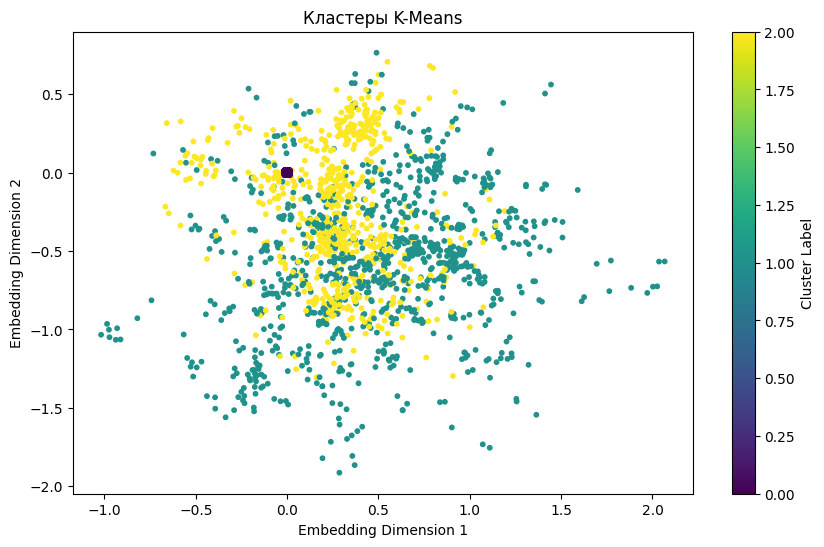

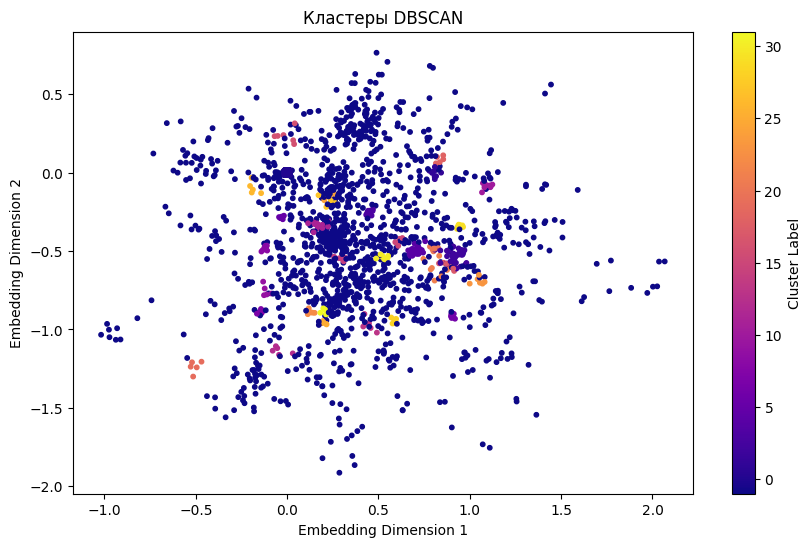

In [11]:
embedding_values = embeddings_df.values

# K-Means кластеризация
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(embedding_values)

# Оценка K-Means кластеризации
silhouette_kmeans = silhouette_score(embedding_values, kmeans_labels)
print(f"Silhouette Score для K-Means: {silhouette_kmeans}")

# DBSCAN кластеризация
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(embedding_values)

# Оценка DBSCAN кластеризации
# Для DBSCAN метка -1 означает "шум", поэтому уберём их для оценки
valid_labels = dbscan_labels[dbscan_labels != -1]
if len(valid_labels) > 1:
    silhouette_dbscan = silhouette_score(embedding_values[dbscan_labels != -1], valid_labels)
    print(f"Silhouette Score для DBSCAN: {silhouette_dbscan}")
else:
    print("DBSCAN не сформировал достаточно кластеров для оценки Silhouette Score.")

# Визуализация кластеров K-Means
plt.figure(figsize=(10, 6))
plt.scatter(
    embedding_values[:, 0],
    embedding_values[:, 1],
    c=kmeans_labels,
    cmap='viridis',
    s=10
)
plt.title("Кластеры K-Means")
plt.xlabel("Embedding Dimension 1")
plt.ylabel("Embedding Dimension 2")
plt.colorbar(label='Cluster Label')
plt.show()

# Визуализация кластеров DBSCAN
plt.figure(figsize=(10, 6))
plt.scatter(
    embedding_values[:, 0],
    embedding_values[:, 1],
    c=dbscan_labels,
    cmap='plasma',
    s=10
)
plt.title("Кластеры DBSCAN")
plt.xlabel("Embedding Dimension 1")
plt.ylabel("Embedding Dimension 2")
plt.colorbar(label='Cluster Label')
plt.show()

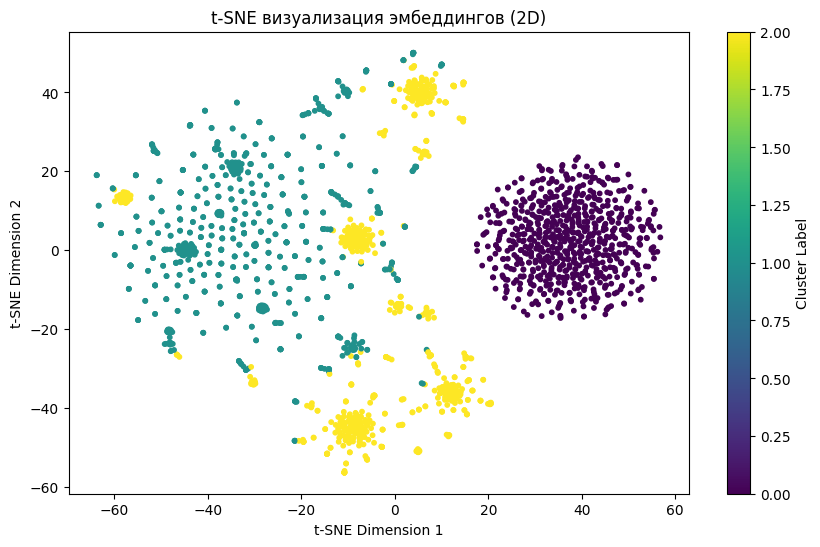

C:\Users\nibek\Downloads\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\nibek\Downloads\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


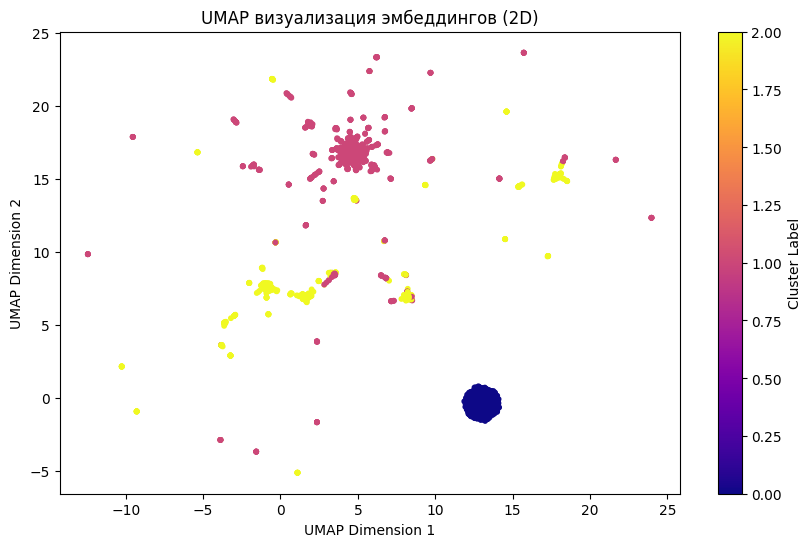

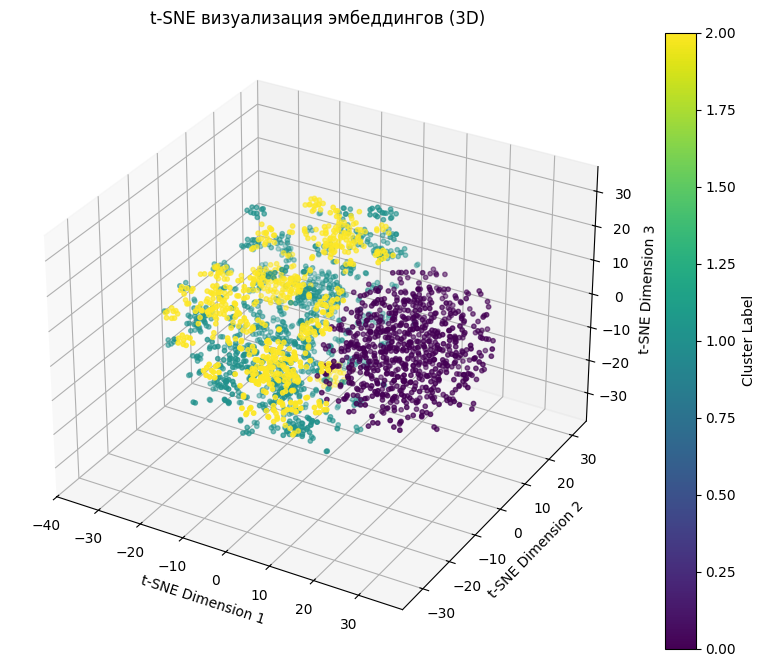

In [14]:
# Снижение размерности с помощью t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
embeddings_2d_tsne = tsne.fit_transform(embedding_values)

# Визуализация t-SNE
plt.figure(figsize=(10, 6))
plt.scatter(embeddings_2d_tsne[:, 0], embeddings_2d_tsne[:, 1], c=kmeans_labels, cmap='viridis', s=10)
plt.title("t-SNE визуализация эмбеддингов (2D)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.colorbar(label='Cluster Label')
plt.show()

# Снижение размерности с помощью UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)
embeddings_2d_umap = umap_reducer.fit_transform(embedding_values)

# Визуализация UMAP
plt.figure(figsize=(10, 6))
plt.scatter(embeddings_2d_umap[:, 0], embeddings_2d_umap[:, 1], c=kmeans_labels, cmap='plasma', s=10)
plt.title("UMAP визуализация эмбеддингов (2D)")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.colorbar(label='Cluster Label')
plt.show()

# Снижение размерности с t-SNE до 3D
tsne_3d = TSNE(n_components=3, random_state=42, perplexity=30)
embeddings_3d_tsne = tsne_3d.fit_transform(embedding_values)

# Визуализация t-SNE в 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(embeddings_3d_tsne[:, 0], embeddings_3d_tsne[:, 1], embeddings_3d_tsne[:, 2],
                     c=kmeans_labels, cmap='viridis', s=10)
ax.set_title("t-SNE визуализация эмбеддингов (3D)")
ax.set_xlabel("t-SNE Dimension 1")
ax.set_ylabel("t-SNE Dimension 2")
ax.set_zlabel("t-SNE Dimension 3")
plt.colorbar(scatter, label='Cluster Label')
plt.show()

In [47]:
# 1. Читаем JSON-файлы
with open('Data/characters.json') as f:
    characters = json.load(f)

with open('Data/houses.json') as f:
    houses = json.load(f)
    
# 2. Строим граф NetworkX
G = nx.Graph()

# Добавляем персонажей и их связи (edges) с домами
for character in characters:
    char_id = f"Character_{character['Id']}"
    char_label = character.get("Name", "Unknown Character")
    
    # Добавляем узел для персонажа
    G.add_node(char_id, label=char_label)
    
    # Связи с домами (аллегиансы)
    for allegiance in character["Allegiances"]:
        house_id = f"House_{allegiance}"
        house_label = f"House {allegiance}"
        
        # Добавляем узел для дома
        G.add_node(house_id, label=house_label)
        
        # Добавляем ребро персонаж - дом
        G.add_edge(char_id, house_id)


# 3. Загружаем или используем embeddings_df
# embeddings_df = pd.read_csv("Data/embeddings.csv", index_col=0)

# Для демонстрации здесь создадим фиктивный DataFrame (закомментируйте и используйте свой):
# idx = ["Character_1", "Character_2", "House_362", "Character_3", "House_15"]
# data = np.random.rand(len(idx), 64)  # 64-мерный вектор
# embeddings_df = pd.DataFrame(data, index=idx)


# 4. Считаем косинусное сходство:
#    а) среди рёбер (character–house)
#    б) среди случайных пар "несвязанных" узлов
edge_sims = []
non_edge_sims = []

edges = list(G.edges())
nodes = list(G.nodes())

# Считаем сходство векторов для каждого ребра (если оба узла есть в embeddings_df)
for (n1, n2) in edges:
    if n1 in embeddings_df.index and n2 in embeddings_df.index:
        v1 = embeddings_df.loc[n1].values.reshape(1, -1)
        v2 = embeddings_df.loc[n2].values.reshape(1, -1)
        sim = cosine_similarity(v1, v2)[0][0]
        edge_sims.append(sim)

# Для сравнения возьмём столько же случайных пар, сколько у нас есть рёбер:
# Генерируем множество всех пар (без повторений)
all_pairs = []
for i in range(len(nodes)):
    for j in range(i+1, len(nodes)):
        if not G.has_edge(nodes[i], nodes[j]):
            all_pairs.append((nodes[i], nodes[j]))

random.shuffle(all_pairs)
num_needed = len(edge_sims)
sampled_pairs = all_pairs[:num_needed]

for (n1, n2) in sampled_pairs:
    if n1 in embeddings_df.index and n2 in embeddings_df.index:
        v1 = embeddings_df.loc[n1].values.reshape(1, -1)
        v2 = embeddings_df.loc[n2].values.reshape(1, -1)
        sim = cosine_similarity(v1, v2)[0][0]
        non_edge_sims.append(sim)

# 5. Анализ результатов
avg_edge = np.mean(edge_sims) if edge_sims else 0
avg_non_edge = np.mean(non_edge_sims) if non_edge_sims else 0

print(f"Число рёбер, учитываемых в сходстве: {len(edge_sims)}")
print(f"Число НЕ-связанных пар, взятых для сравнения: {len(non_edge_sims)}")
print(f"Среднее косинусное сходство для связанных узлов (персонаж–дом): {avg_edge:.4f}")
print(f"Среднее косинусное сходство для случайных пар (не связанных узлов): {avg_non_edge:.4f}")

# Если эмбеддинги "хорошо" отражают структуру,
# ожидаем, что avg_edge > avg_non_edge (в среднем).


Число рёбер, учитываемых в сходстве: 1567
Число НЕ-связанных пар, взятых для сравнения: 1567
Среднее косинусное сходство для связанных узлов (персонаж–дом): 0.9398
Среднее косинусное сходство для случайных пар (не связанных узлов): 0.1757


большие различия в средней схожести (0.94 vs. 0.18) показывают, что векторы персонажей и домов, которые связаны в графе, оказались намного ближе друг к другу, чем случайные пары

# Part 3: Sparql queries

In [2]:
rdf_graph = Graph()
rdf_graph.parse("Data/ontology.ttl", format="turtle")

# Определение списка запросов
queries = [
    {"description": "1. Персонажи, которые принадлежат дому в регионе 'The North'",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?house
WHERE {
    ?character a :Character ;
               :belongsToHouse ?house .
    ?house a :House ;
           :hasRegion "The North" .
}
"""},
    {"description": "2. Дома, у которых есть лорд и указанный регион",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house ?lord ?region
WHERE {
    ?house a :House ;
           :hasRegion ?region ;
           :isRuledBy ?lord .
}
"""},
    {"description": "3. Персонажи с более чем одним псевдонимом",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character (COUNT(?alias) AS ?aliasCount)
WHERE {
    ?character a :Character ;
               :hasAlias ?alias .
}
GROUP BY ?character
HAVING (COUNT(?alias) > 1)
"""},
    {"description": "4. Дома с более чем одной ветвью",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house (COUNT(?cadetBranch) AS ?branchCount)
WHERE {
    ?house a :House ;
           :hasCadetBranch ?cadetBranch .
}
GROUP BY ?house
HAVING (COUNT(?cadetBranch) > 1)
"""},
    {"description": "5. Дома, у которых есть хотя бы одно оружие",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house ?weapon
WHERE {
    ?house a :House ;
           :hasAncestralWeapon ?weapon .
}
"""},
    {"description": "6. Персонажи с титулами, принадлежащие дому с ветвями",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?house ?title
WHERE {
    ?character a :Character ;
               :hasTitle ?title ;
               :belongsToHouse ?house .
    ?house a :House ;
           :hasCadetBranch ?branch .
}
"""},
    {"description": "7. Персонажи, связанные с домами с оружием и регионом",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?house ?region ?weapon
WHERE {
    ?character a :Character ;
               :belongsToHouse ?house .
    ?house a :House ;
           :hasRegion ?region ;
           :hasAncestralWeapon ?weapon .
}
"""},
    {"description": "8. Персонажи с более чем двумя титулами",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character (COUNT(?title) AS ?titleCount)
WHERE {
    ?character a :Character ;
               :hasTitle ?title .
}
GROUP BY ?character
HAVING (COUNT(?title) > 2)
"""},
    {"description": "9. Персонажи, связанные через одну ветвь дома",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT DISTINCT ?character1 ?character2 ?cadetBranch
WHERE {
    ?character1 a :Character ;
                :belongsToHouse ?house1 .
    ?character2 a :Character ;
                :belongsToHouse ?house2 .
    ?house1 :hasCadetBranch ?cadetBranch .
    ?house2 :hasCadetBranch ?cadetBranch .
    FILTER (?character1 != ?character2)
}
"""},
    {"description": "10. Персонажи с титулами, не принадлежащие дому",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?title
WHERE {
    ?character a :Character ;
               :hasTitle ?title .
    FILTER NOT EXISTS {
        ?character :belongsToHouse ?house .
    }
}
"""}
]

for i, query_item in enumerate(queries):
    print(f"\n{i+1}. {query_item['description']}")
    results = rdf_graph.query(query_item['query'])
    for row in results:
        print(row)


1. 1. Персонажи, которые принадлежат дому в регионе 'The North'
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1882'), rdflib.term.URIRef('http://example.org/gameofthrones#House_131'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_930'), rdflib.term.URIRef('http://example.org/gameofthrones#House_174'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1031'), rdflib.term.URIRef('http://example.org/gameofthrones#House_236'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_461'), rdflib.term.URIRef('http://example.org/gameofthrones#House_267'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1498'), rdflib.term.URIRef('http://example.org/gameofthrones#House_352'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1018'), rdflib.term.URIRef('http://example.org/gameofthrones#House_421'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1753'), rdflib.term.URIRef('http://example.or

In [39]:
rdf_graph = Graph()
rdf_graph.parse("Data/ontology.ttl", format="turtle")

queries = [
    {
        "description": "1. Все персонажи (URI)",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?character
WHERE {
    ?character rdf:type got:Character .
}
"""
    },
    {
        "description": "2. Все дома (URI)",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?house
WHERE {
    ?house rdf:type got:House .
}
"""
    },
    {
        "description": "3. Персонажи с rdfs:label",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?character ?label
WHERE {
    ?character rdf:type got:Character ;
               rdfs:label ?label .
}
"""
    },
    {
        "description": "4. Все дома и их регион (если указан)",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?house ?region
WHERE {
    ?house rdf:type got:House .
    OPTIONAL { ?house got:hasRegion ?region . }
}
"""
    },
    {
        "description": "5. Персонажи и дома, к которым они принадлежат",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?character ?house
WHERE {
    ?character rdf:type got:Character ;
               got:belongsToHouse ?house .
}
"""
    },
    {
        "description": "6. Персонажи, их дом, и регион дома (если есть)",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?character ?house ?region
WHERE {
    ?character rdf:type got:Character ;
               got:belongsToHouse ?house .
    OPTIONAL {
        ?house got:hasRegion ?region .
    }
}
"""
    },
    {
        "description": "7. Все регионы, которые встречаются у домов (DISTINCT)",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT DISTINCT ?region
WHERE {
    ?house rdf:type got:House ;
           got:hasRegion ?region .
}
"""
    },
    {
        "description": "8. Все персонажи (URI) + их rdfs:label, если есть",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?character ?label
WHERE {
    ?character rdf:type got:Character .
    OPTIONAL { ?character rdfs:label ?label . }
}
"""
    },
    {
        "description": "9. Подсчитать, сколько персонажей у каждого дома",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?house (COUNT(?character) as ?numberOfCharacters)
WHERE {
    ?character rdf:type got:Character ;
               got:belongsToHouse ?house .
}
GROUP BY ?house
ORDER BY DESC(?numberOfCharacters)
"""
    },
    {
        "description": "10. Дома: URI, его rdfs:label (если есть) и регион (если есть)",
        "query": """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
PREFIX got: <http://example.org/gameofthrones#>

SELECT ?house ?label ?region
WHERE {
    ?house rdf:type got:House .
    OPTIONAL { ?house rdfs:label ?label . }
    OPTIONAL { ?house got:hasRegion ?region . }
}
"""
    },
]


# Выполним все 10 запросов и выведем результаты
for i, query_item in enumerate(queries, start=1):
    print(f"\n{i}. {query_item['description']}")
    results = rdf_graph.query(query_item['query'])
    for row in results:
        print(row)
    
    if not results:
        print("   (Нет результатов)")



1. 1. Все персонажи (URI)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_10'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_100'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1000'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1001'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1002'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1003'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1004'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1005'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1006'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1007'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1008'),)
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1009'),)
(rdflib.term.URIRef('http://ex

In [7]:
rdf_graph = Graph()
rdf_graph.parse("Data/ontology.ttl", format="turtle")

# Определение списка запросов
queries = [
    {"description": "1. Персонажи и их свойства",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?property ?value
WHERE {
    ?character a :Character ;
               ?property ?value .
}
"""},
    {"description": "2. Дома и их свойства",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house ?property ?value
WHERE {
    ?house a :House ;
           ?property ?value .
}
"""},
    {"description": "3. Персонажи, связанные с домами",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?house
WHERE {
    ?character a :Character ;
               :belongsToHouse ?house .
}
"""},
    {"description": "4. Дома без указанных регионов",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house
WHERE {
    ?house a :House .
    FILTER NOT EXISTS { ?house :hasRegion ?region . }
}
"""},
    {"description": "5. Персонажи с хотя бы одним псевдонимом",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character ?alias
WHERE {
    ?character a :Character ;
               :hasAlias ?alias .
}
"""},
    {"description": "6. Дома с ветвями",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house ?branch
WHERE {
    ?house a :House ;
           :hasCadetBranch ?branch .
}
"""},
    {"description": "7. Дома с регионами (если есть)",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house ?region
WHERE {
    ?house a :House .
    OPTIONAL { ?house :hasRegion ?region . }
}
"""},
    {"description": "8. Персонажи, не принадлежащие домам",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character
WHERE {
    ?character a :Character .
    FILTER NOT EXISTS { ?character :belongsToHouse ?house . }
}
"""},
    {"description": "9. Персонажи с более чем двумя титулами",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?character (COUNT(?title) AS ?titleCount)
WHERE {
    ?character a :Character ;
               :hasTitle ?title .
}
GROUP BY ?character
HAVING (COUNT(?title) > 2)
"""},
    {"description": "10. Дома с предками (оружие)",
     "query": """
PREFIX : <http://example.org/gameofthrones#>
SELECT ?house ?weapon
WHERE {
    ?house a :House ;
           :hasAncestralWeapon ?weapon .
}
"""}
]

# Выполнение запросов
for i, query_item in enumerate(queries):
    print(f"\n{i+1}. {query_item['description']}")
    results = rdf_graph.query(query_item['query'])
    for row in results:
        print(row)



1. 1. Персонажи и их свойства
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1'), rdflib.term.URIRef('http://www.w3.org/1999/02/22-rdf-syntax-ns#type'), rdflib.term.URIRef('http://example.org/gameofthrones#Character'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_1'), rdflib.term.URIRef('http://example.org/gameofthrones#hasAlias'), rdflib.term.Literal('The Daughter of the Dusk'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_10'), rdflib.term.URIRef('http://www.w3.org/1999/02/22-rdf-syntax-ns#type'), rdflib.term.URIRef('http://example.org/gameofthrones#Character'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_10'), rdflib.term.URIRef('http://example.org/gameofthrones#hasAlias'), rdflib.term.Literal('The Veiled Lady'))
(rdflib.term.URIRef('http://example.org/gameofthrones#Character_100'), rdflib.term.URIRef('http://www.w3.org/1999/02/22-rdf-syntax-ns#type'), rdflib.term.URIRef('http://example.org/gameofthrones#Cha

# Part 4: Classifier model

In [1]:
# ToDo

# Bonus part

## Additional plots

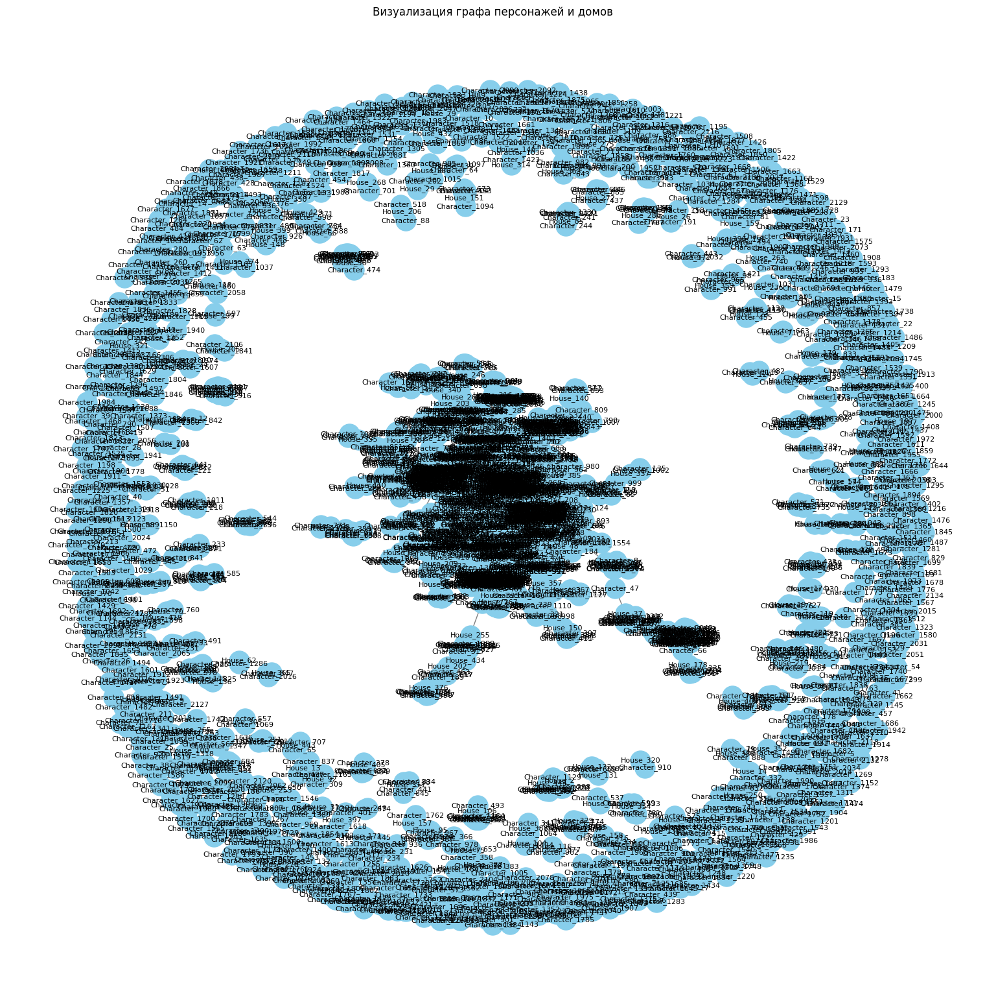

In [15]:
# Визуализация графа NetworkX
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42)  # Aлгоритм spring для расположения узлов
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=500,
    node_color="skyblue",
    edge_color="gray",
    font_size=8,
    font_color="black"
)
plt.title("Визуализация графа персонажей и домов")
plt.show()


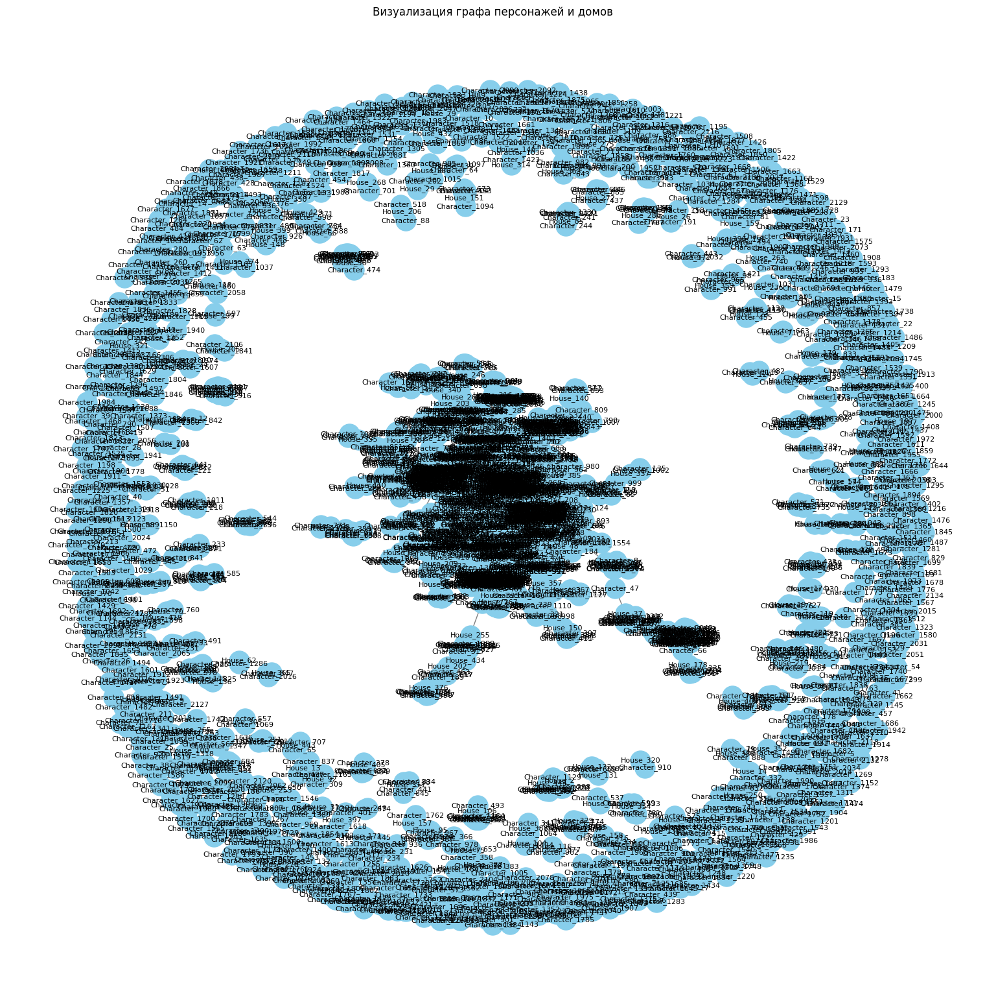

In [16]:
# Визуализация графа NetworkX
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42)  # Aлгоритм spring для расположения узлов
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=500,
    node_color="skyblue",
    edge_color="gray",
    font_size=8,
    font_color="black"
)
plt.title("Визуализация графа персонажей и домов")
plt.show()


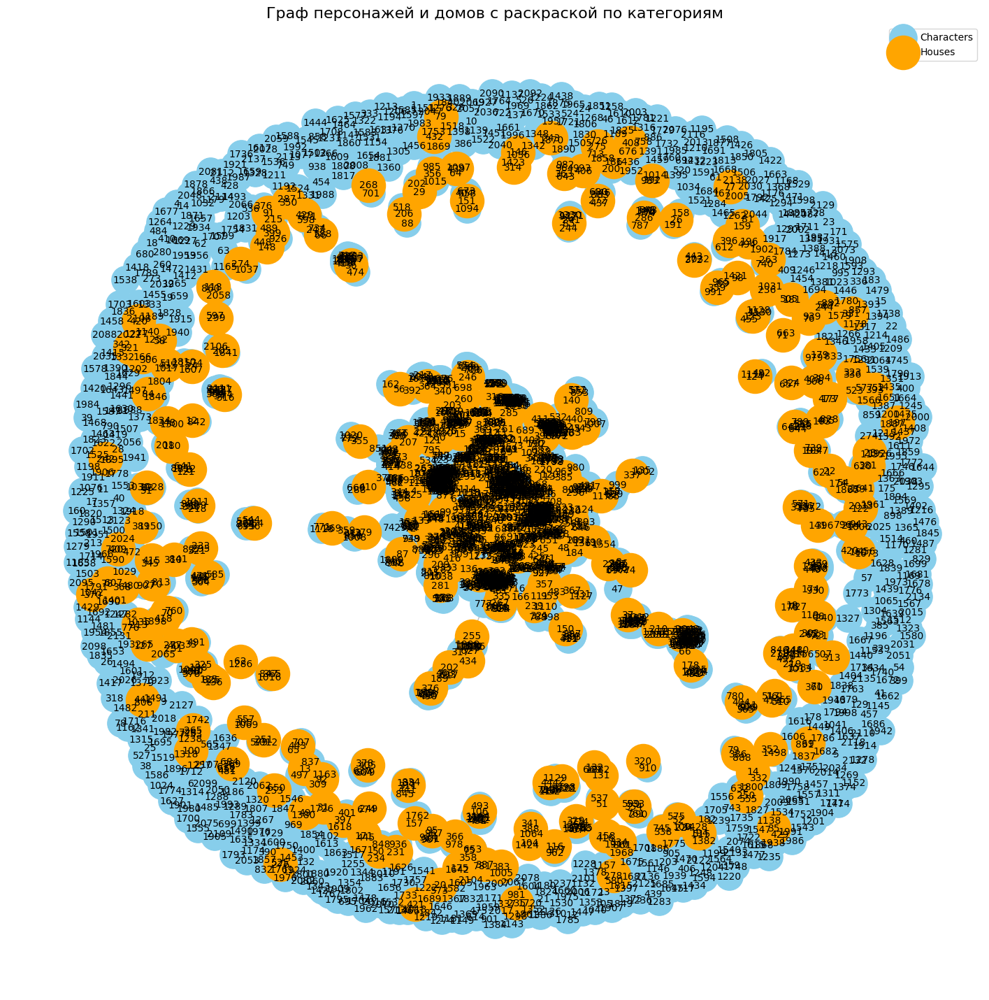

In [17]:
# Настраиваем визуализацию графа с улучшенной читаемостью
plt.figure(figsize=(18, 18))

# Позиционирование узлов
pos = nx.spring_layout(G, seed=42)

# Разделение узлов по домам для окраски
house_nodes = [node for node in G.nodes if node.startswith("House")]
character_nodes = [node for node in G.nodes if node.startswith("Character")]

# Уникальные цвета для домов
house_colors = {house: plt.cm.tab20(i) for i, house in enumerate(house_nodes)}

# Окрашиваем узлы
node_colors = [
    house_colors[edge[1]] if edge[1] in house_colors else "skyblue" 
    for edge in G.edges(data=True)
]

# Названия узлов
node_labels = {node: node.split("_")[1] if "Character" in node else node.split("_")[1] for node in G.nodes}

# Визуализация графа
nx.draw_networkx_nodes(G, pos, nodelist=character_nodes, node_size=800, node_color="skyblue", label="Characters")
nx.draw_networkx_nodes(G, pos, nodelist=house_nodes, node_size=1200, node_color="orange", label="Houses")
nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_color="black")

# Настройки графика
plt.title("Граф персонажей и домов с раскраской по категориям", fontsize=16)
plt.legend(loc="best")
plt.axis("off")
plt.show()

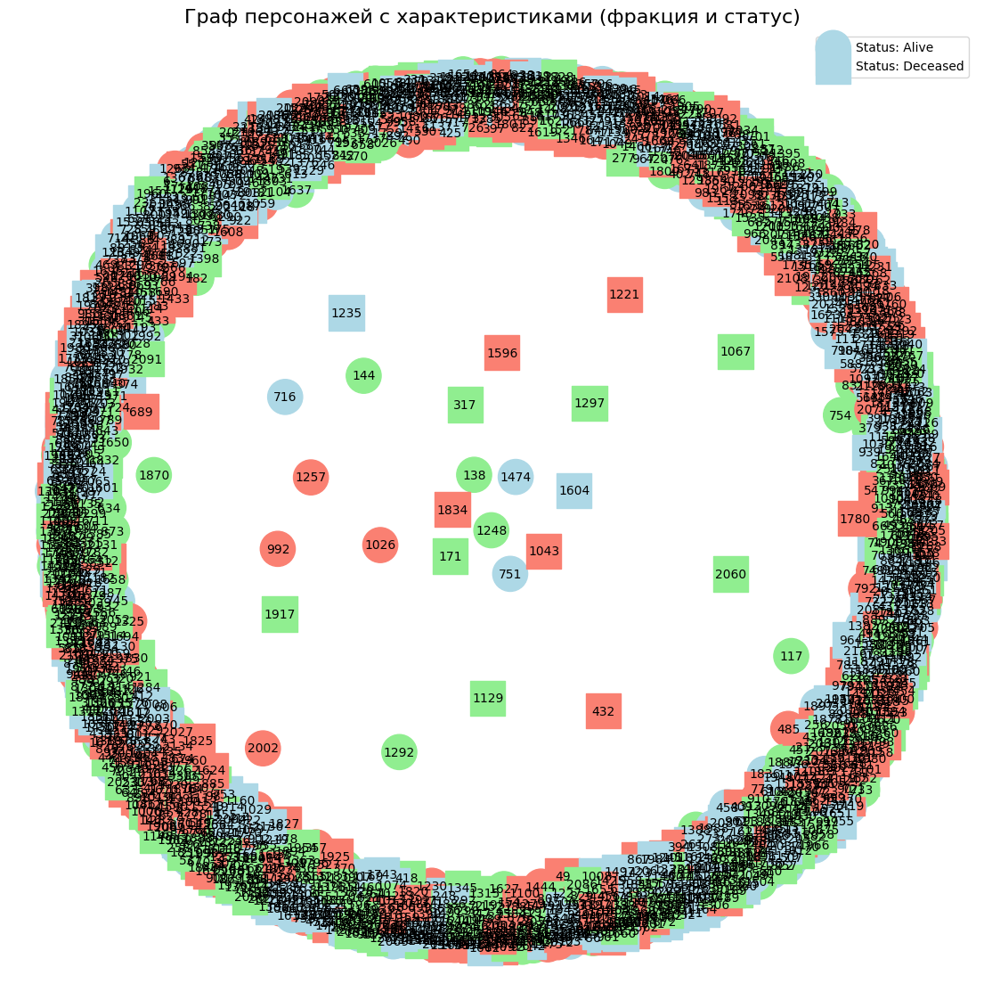

In [18]:
# Фильтруем граф только для узлов персонажей
character_graph = G.subgraph([node for node in G.nodes if node.startswith("Character")])

# Генерируем случайные характеристики для демонстрации раскраски (статус или фракция)
# Пример характеристик
character_attributes = {
    node: {"Faction": random.choice(["Faction A", "Faction B", "Faction C"]), 
           "Status": random.choice(["Alive", "Deceased"])} 
    for node in character_graph.nodes
}

# Добавляем характеристики к узлам
nx.set_node_attributes(character_graph, character_attributes)

# Цветовая палитра для характеристик
faction_colors = {"Faction A": "lightblue", "Faction B": "lightgreen", "Faction C": "salmon"}
status_shapes = {"Alive": "o", "Deceased": "s"}

# Разделяем узлы по характеристикам
node_colors = [faction_colors[character_attributes[node]["Faction"]] for node in character_graph.nodes]
node_shapes = {status: [node for node, attr in character_attributes.items() if attr["Status"] == status] 
               for status in status_shapes.keys()}

# Позиционирование узлов
pos = nx.spring_layout(character_graph, seed=42)

# Визуализация узлов с разной формой по статусу
plt.figure(figsize=(14, 14))
for status, shape_nodes in node_shapes.items():
    nx.draw_networkx_nodes(
        character_graph,
        pos,
        nodelist=shape_nodes,
        node_size=800,
        node_color=[faction_colors[character_attributes[node]["Faction"]] for node in shape_nodes],
        label=f"Status: {status}",
        node_shape=status_shapes[status],
    )

# Визуализация связей
nx.draw_networkx_edges(character_graph, pos, edge_color="gray", alpha=0.5)

# Визуализация меток узлов
node_labels = {node: node.split("_")[1] for node in character_graph.nodes}
nx.draw_networkx_labels(character_graph, pos, labels=node_labels, font_size=10, font_color="black")

# Настройка легенды и графика
plt.title("Граф персонажей с характеристиками (фракция и статус)", fontsize=16)
plt.legend(scatterpoints=1, loc="best", fontsize=10)
plt.axis("off")
plt.show()

In [34]:
# Подготовка файла рёбер (Graph Data)
edges_data = [
    {"source": edge[0], "target": edge[1], "weight": 1, "color": "#888888"}  # Пример: добавляем вес и цвет
    for edge in G.edges
]

# Создание DataFrame для рёбер
edges_df = pd.DataFrame(edges_data)
edges_file_path = "Data/graph_edges.csv"
edges_df.to_csv(edges_file_path, index=False)
print(f"Файл рёбер сохранён: {edges_file_path}")

# Подготовка файла узлов (Graph Metadata)
nodes_data = [
    {
        "id": node,
        "color": "#00CCFF" if "Character" in node else "#FF5733",  # Цвет узла (пример: персонажи и дома)
        "size": 10,  # Размер узла
    }
    for node in G.nodes
]

# Создание DataFrame для узлов
nodes_df = pd.DataFrame(nodes_data)
nodes_file_path = "Data/graph_metadata.csv"
nodes_df.to_csv(nodes_file_path, index=False)
print(f"Файл узлов сохранён: {nodes_file_path}")

Файл рёбер сохранён: graph_edges.csv
Файл узлов сохранён: graph_metadata.csv


## Graph creation with Cosmograph

In [36]:
with open("Data/characters.json", "r") as f:
    characters_data = json.load(f)

with open("Data/houses.json", "r") as f:
    houses_data = json.load(f)

# Создание графа
G = nx.Graph()

# Добавление узлов и атрибутов для домов
house_dict = {house["Id"]: house["Name"] for house in houses_data}
for house in houses_data:
    G.add_node(f"House_{house['Id']}", label=house["Name"], type="House")

# Добавление узлов и атрибутов для персонажей
for character in characters_data:
    char_id = f"Character_{character['Id']}"
    char_name = character["Name"] or character["Aliases"][0] if character["Aliases"] else "Unknown"
    G.add_node(char_id, label=char_name, type="Character")

    # Добавление рёбер между персонажами и их домами
    for allegiance in character.get("Allegiances", []):
        if allegiance in house_dict:
            G.add_edge(char_id, f"House_{allegiance}", relation="allegiance")

# Проверка графа
print(f"Количество узлов: {G.number_of_nodes()}")
print(f"Количество рёбер: {G.number_of_edges()}")

# Сохранение графа в формате GraphML
nx.write_graphml(G, "Data/game_of_thrones.graphml")
print("Граф сохранён в файл Data/game_of_thrones.graphml.")

Количество узлов: 2578
Количество рёбер: 1567
Граф сохранён в файл game_of_thrones.graphml.


In [37]:
G

In [38]:
# Подготовка узлов для Cosmosgraph
nodes_data = []
for node, attrs in G.nodes(data=True):
    nodes_data.append({
        "id": node,
        "label": attrs.get("label", "Unknown"),
        "type": attrs.get("type", "Unknown"),
        "color": "#FF5733" if attrs.get("type") == "House" else "#3498DB",  # Цвет: дома — оранжевый, персонажи — синий
        "size": 15 if attrs.get("type") == "House" else 10  # Размер: дома крупнее
    })

# Подготовка рёбер для Cosmosgraph
edges_data = []
for source, target, attrs in G.edges(data=True):
    edges_data.append({
        "source": source,
        "target": target,
        "weight": 1,  # Вес рёбер
        "color": "#888888"
    })

# Создание DataFrame для узлов и рёбер
nodes_df = pd.DataFrame(nodes_data)
edges_df = pd.DataFrame(edges_data)

# Сохранение в файлы CSV
nodes_file_path = "Data/cosmosgraph_nodes.csv"
edges_file_path = "Data/cosmosgraph_edges.csv"

nodes_df.to_csv(nodes_file_path, index=False)
edges_df.to_csv(edges_file_path, index=False)

nodes_file_path, edges_file_path

('cosmosgraph_nodes.csv', 'cosmosgraph_edges.csv')

In [1]:
# Эти файлы используем, чтобы создать визуализацию в https://cosmograph.app/